In [74]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import json
import albumentations as A
from tqdm.auto import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device is:", device)

Device is: cuda


In [38]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="JTmXF1xAquRVAIRetDvW")
project = rf.workspace("sunjune-kim").project("kick-scooter-3")
version = project.version(2)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Kick-Scooter-3-2 in coco:: 100%|██████████| 3582/3582 [00:00<00:00, 7814.99it/s]


In [17]:
def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [121]:
def parse_images_info(path="/kaggle/working/Kick-Scooter-3-2/train/_annotations.coco.json"):
    with open(path, "r") as f:
        annotation_dict = json.load(f)
    
    bboxes_dict = {}
    for item in tqdm(annotation_dict['annotations']):
        image_filename = annotation_dict['images'][item['image_id']]['file_name']
        if len(np.array(item['bbox']).shape) == 1:
            bboxes_dict[image_filename] = [item['bbox']]
        else:
            bboxes_dict[image_filename] = item['bbox']
            print(item['bbox'])
        
        if len(item['bbox']) == 3:
            print(item['bbox'])
    
    return bboxes_dict

train_bboxes_dict = parse_images_info()
test_bboxes_dict = parse_images_info('/kaggle/working/Kick-Scooter-3-2/test/_annotations.coco.json')

  0%|          | 0/3318 [00:00<?, ?it/s]

  0%|          | 0/160 [00:00<?, ?it/s]

In [122]:
with open('/kaggle/working/Kick-Scooter-3-2/train/_annotations.coco.json', "r") as f:
        annotation_dict = json.load(f)

In [136]:
list(train_bboxes_dict.keys())[12]

'Dnaver_0527_jpg.rf.1758945e6c944fdbedd79922c4604dc4.jpg'

(212, 133) (146, 45)


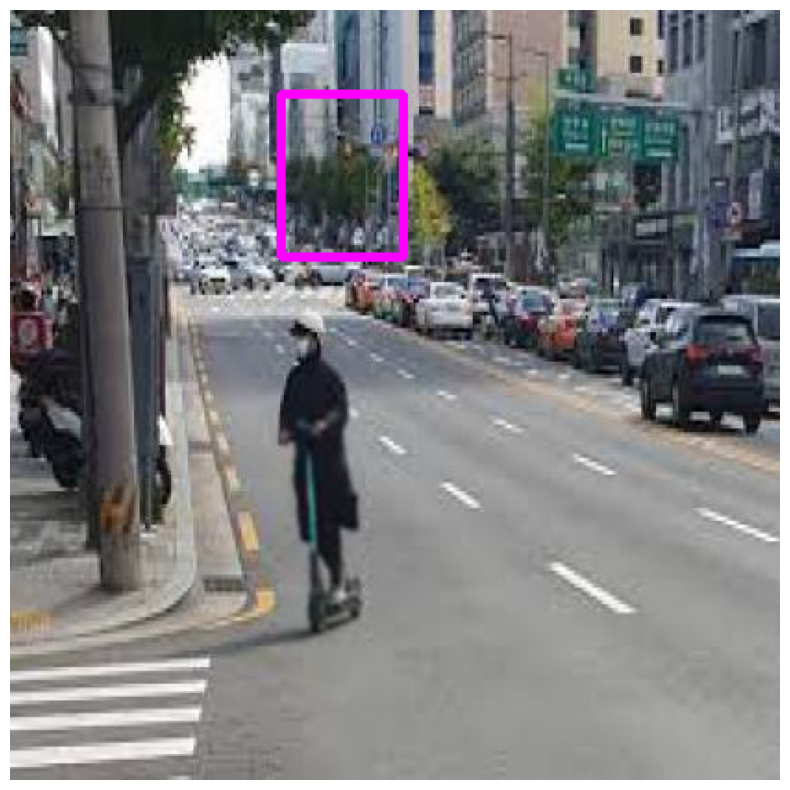

In [99]:
test_image = cv2.imread("/kaggle/working/Kick-Scooter-3-2/train/Dgoogle_0876_jpg.rf.16b702fe4c314f6d45e45d427a9afd01.jpg")
test_bbox = train_bboxes_dict['Dgoogle_0876_jpg.rf.16b702fe4c314f6d45e45d427a9afd01.jpg']
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255

imageRectangle = test_image.copy()

h, w = imageRectangle.shape[:2]

for item in test_bbox:
    x2 = int(item[0])
    x1 = int(item[1])
    y2 = int(item[2])
    y1 = int(item[3])
    print((x1, y1), (x2, y2))
    color = (255, 0, 255)
    thickness = 3

    cv2.rectangle(imageRectangle, (x1, y1), (x2, y2), color, thickness)


show_image(imageRectangle)

In [108]:
from PIL import Image, ImageDraw

class ScooterDataset(torch.utils.data.Dataset):
    def __init__(self, bbox_dict_file,
                 transforms=None,
                 augment=False,
                 add_path=None):

        self.transforms = transforms
        self.augment = augment
        
        self.bbox_dict = parse_images_info(bbox_dict_file)

        if add_path:
            self.bbox_dict = {add_path + path: value for path, value in self.bbox_dict.items()}

        self.imgs = list(self.bbox_dict.keys())

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        image = Image.open(img_path).convert("RGB")
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255

        w, h = image.size

        bboxes = []
        labels = []

        for bbox in self.bbox_dict[img_path]:
            xmin = int(bbox[0])
            ymin = int(bbox[1])
            xmax = int(bbox[2])
            ymax = int(bbox[3])
            
            if xmin > xmax:
                xmin, xmax = xmax, xmin
            
            if ymin > ymax:
                ymin, ymax = ymax, ymin

            bboxes.append([xmin, ymin, xmax, ymax])
        

        num_objs = len(self.bbox_dict[img_path])

        

        # image = torch.from_numpy(image).permute(2, 0, 1).to(torch.float)

        if self.transforms:
            image = self.transforms(image)
        
        bboxes = torch.FloatTensor(bboxes)
        labels = torch.ones((num_objs,), dtype=torch.int64)
            

        target = {'boxes': bboxes,
                  'labels': labels,
                  'image_id': torch.tensor([idx])}

        return image, target


In [109]:
from torchvision import transforms

def collate_fn(batch):
    return tuple(zip(*batch))

img_transforms = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = ScooterDataset('/kaggle/working/Kick-Scooter-3-2/train/_annotations.coco.json',
                             add_path='/kaggle/working/Kick-Scooter-3-2/train/',
                             transforms=img_transforms)

val_dataset = ScooterDataset('/kaggle/working/Kick-Scooter-3-2/test/_annotations.coco.json',
                             add_path='/kaggle/working/Kick-Scooter-3-2/test/',
                             transforms=img_transforms)



train_data_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    collate_fn=collate_fn
)

val_data_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn
)

  0%|          | 0/3318 [00:00<?, ?it/s]

  0%|          | 0/160 [00:00<?, ?it/s]

In [110]:
train_dataset[1]

(tensor([[[0.5373, 0.3176, 0.1333,  ..., 0.2824, 0.2980, 0.3137],
          [0.4784, 0.3333, 0.1961,  ..., 0.3216, 0.3255, 0.3216],
          [0.5765, 0.5020, 0.4078,  ..., 0.2588, 0.2667, 0.2588],
          ...,
          [0.5059, 0.5059, 0.5059,  ..., 0.6314, 0.6314, 0.6353],
          [0.4980, 0.4980, 0.5020,  ..., 0.6235, 0.6235, 0.6275],
          [0.5137, 0.5137, 0.5098,  ..., 0.6157, 0.6196, 0.6235]],
 
         [[0.5647, 0.3451, 0.1608,  ..., 0.3216, 0.3373, 0.3529],
          [0.5059, 0.3608, 0.2235,  ..., 0.3608, 0.3647, 0.3608],
          [0.6157, 0.5412, 0.4471,  ..., 0.2980, 0.3059, 0.2980],
          ...,
          [0.5020, 0.5020, 0.5020,  ..., 0.6314, 0.6314, 0.6353],
          [0.4941, 0.4941, 0.4980,  ..., 0.6235, 0.6235, 0.6275],
          [0.5098, 0.5098, 0.5059,  ..., 0.6157, 0.6196, 0.6235]],
 
         [[0.5333, 0.3137, 0.1294,  ..., 0.3686, 0.3843, 0.4000],
          [0.4745, 0.3294, 0.1922,  ..., 0.4078, 0.4118, 0.4078],
          [0.5843, 0.5098, 0.4157,  ...,

In [111]:
model_pretrained = fasterrcnn_resnet50_fpn_v2(pretrained=True)
in_features = model_pretrained.roi_heads.box_predictor.cls_score.in_features
model_pretrained.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=2)

optimizer = torch.optim.Adam(model_pretrained.parameters(), lr=1e-4, weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)

model_pretrained.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [112]:
for images, targets in train_data_loader:
    print(images, targets)
    break

(tensor([[[0.7176, 0.7176, 0.7255,  ..., 0.6078, 0.6078, 0.6078],
         [0.7176, 0.7176, 0.7255,  ..., 0.6078, 0.6078, 0.6078],
         [0.7176, 0.7176, 0.7255,  ..., 0.6078, 0.6078, 0.6078],
         ...,
         [0.7569, 0.7333, 0.7020,  ..., 0.7843, 0.7843, 0.7804],
         [0.7804, 0.7255, 0.6627,  ..., 0.7804, 0.7765, 0.7725],
         [0.5686, 0.5569, 0.5765,  ..., 0.7725, 0.7725, 0.7686]],

        [[0.5843, 0.5843, 0.5843,  ..., 0.4706, 0.4706, 0.4706],
         [0.5843, 0.5843, 0.5843,  ..., 0.4706, 0.4706, 0.4706],
         [0.5843, 0.5843, 0.5843,  ..., 0.4706, 0.4706, 0.4706],
         ...,
         [0.4941, 0.4706, 0.4392,  ..., 0.5176, 0.5176, 0.5137],
         [0.5176, 0.4627, 0.4000,  ..., 0.5137, 0.5098, 0.5059],
         [0.3059, 0.2941, 0.3137,  ..., 0.5059, 0.5059, 0.5020]],

        [[0.6392, 0.6392, 0.6392,  ..., 0.5569, 0.5569, 0.5569],
         [0.6392, 0.6392, 0.6392,  ..., 0.5569, 0.5569, 0.5569],
         [0.6392, 0.6392, 0.6392,  ..., 0.5569, 0.5569, 0

In [131]:
def train_loop(model, optimizer, data_loader):
    model.train()
    epoch_loss = 0
    for images, targets in tqdm(data_loader):
        try:
            optimizer.zero_grad()
            # images, targets = data[0], data[1]
            images = [image.to(device) for image in images]

            targets = [{key: value.to(device) for key, value in target.items()} for target in targets]
            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())
            epoch_loss += loss.item()
            loss.backward()
            optimizer.step()
        
        except:
            print('invalid bbox')
#         if i % 50 == 0:
#             print(f"iteration {i} loss: {loss}")

    train_loss = epoch_loss / len(data_loader.dataset)
    return train_loss

def val_loop(model, optimizer, data_loader):
    epoch_loss = 0
    for images, targets in tqdm(data_loader):
        optimizer.zero_grad()
        images = [image.to(device) for image in images]
        targets = [{key: value.to(device) for key, value in target.items()} for target in targets]
        with torch.no_grad():
            loss_dict = model(images, targets)

        loss = sum(loss for loss in loss_dict.values())
        epoch_loss += loss.item()

    val_loss = epoch_loss / len(data_loader.dataset)
    return val_loss

In [132]:
num_epochs = 15
for i in range(num_epochs):
    train_loss = train_loop(model_pretrained, optimizer, train_data_loader)
    print(f'train loss: {train_loss}')
# val_loop(model, optimizer, val_data_loader)

  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.04068151351149909


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.028608122052062594


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.024320008011146865


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.022772147754660556


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.023233682902557486


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.017892328301696857


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.016796094063356068


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.016690629172870772


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.017069242443022995


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.015655750513505786


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.013460702543095377


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.012556982357800677


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.019711837182563006


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.014251941550662133


  0%|          | 0/556 [00:00<?, ?it/s]

invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
invalid bbox
train loss: 0.010790799419742095


In [133]:
torch.save(model_pretrained.state_dict(), 'resnet50_scooter_detect.pth')

In [135]:
!pip install deep_sort_realtime
!pip install boxmot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 35.6 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 85.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 775.1/775.1 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 88.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 82.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [143]:
list(train_bboxes_dict.keys())[115]

'Cnaver_0140_jpg.rf.23444fbae2ab2000723f1698a78b7eb2.jpg'

In [202]:
test_image = cv2.imread("/kaggle/working/Kick-Scooter-3-2/train/Cnaver_0140_jpg.rf.23444fbae2ab2000723f1698a78b7eb2.jpg")
test_bbox = train_bboxes_dict['Cnaver_0140_jpg.rf.23444fbae2ab2000723f1698a78b7eb2.jpg']
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255

train_dataset[123]

# imageRectangle = test_image.copy()

# h, w = imageRectangle.shape[:2]

# for item in test_bbox:
#     x1 = int(item[0])
#     y1 = int(item[1])
#     x2 = int(item[2])
#     y2 = int(item[3])
#     print((x1, y1), (x2, y2))
#     color = (255, 0, 255)
#     thickness = 3

#     cv2.rectangle(imageRectangle, (x1, y1), (x2, y2), color, thickness)


# show_image(imageRectangle)

(tensor([[[0.0941, 0.1922, 0.3961,  ..., 0.9529, 0.9765, 1.0000],
          [0.0863, 0.1922, 0.3961,  ..., 0.9882, 0.9961, 1.0000],
          [0.0824, 0.1922, 0.4000,  ..., 1.0000, 0.9922, 0.9843],
          ...,
          [0.4627, 0.4667, 0.4745,  ..., 0.8667, 0.8706, 0.8627],
          [0.4706, 0.4706, 0.4784,  ..., 0.8627, 0.8667, 0.8549],
          [0.4745, 0.4745, 0.4784,  ..., 0.8588, 0.8667, 0.8510]],
 
         [[0.1137, 0.2118, 0.4157,  ..., 0.7647, 0.7529, 0.8078],
          [0.1059, 0.2118, 0.4157,  ..., 0.7961, 0.7804, 0.7882],
          [0.1020, 0.2118, 0.4196,  ..., 0.8157, 0.7922, 0.7686],
          ...,
          [0.4667, 0.4706, 0.4784,  ..., 0.8627, 0.8667, 0.8588],
          [0.4745, 0.4745, 0.4824,  ..., 0.8588, 0.8627, 0.8510],
          [0.4784, 0.4784, 0.4824,  ..., 0.8549, 0.8627, 0.8471]],
 
         [[0.0863, 0.1843, 0.3882,  ..., 0.6863, 0.6745, 0.7216],
          [0.0784, 0.1843, 0.3882,  ..., 0.7294, 0.7020, 0.7098],
          [0.0745, 0.1843, 0.3922,  ...,

In [191]:
val_loop(model_pretrained, optimizer, val_data_loader)

  0%|          | 0/28 [00:00<?, ?it/s]

AttributeError: 'list' object has no attribute 'values'

In [180]:
train_dataset[123][0].size()

torch.Size([3, 416, 416])

In [200]:
!pip install boxmot

In [195]:
model_pretrained.to(device)
model_pretrained.eval()
with torch.no_grad():
    for image, labels in val_data_loader:
#         print(image[0].to(device).size())
        prediction = model_pretrained([image[0].to(device)])
        print(prediction)
        break
#     predictions = model_pretrained(train_dataset[123][0])

[{'boxes': tensor([[ 34.5571,  60.8755, 224.4406, 247.9917],
        [ 27.3509, 268.9139, 230.9629, 303.1437]], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0'), 'scores': tensor([0.9899, 0.0795], device='cuda:0')}]


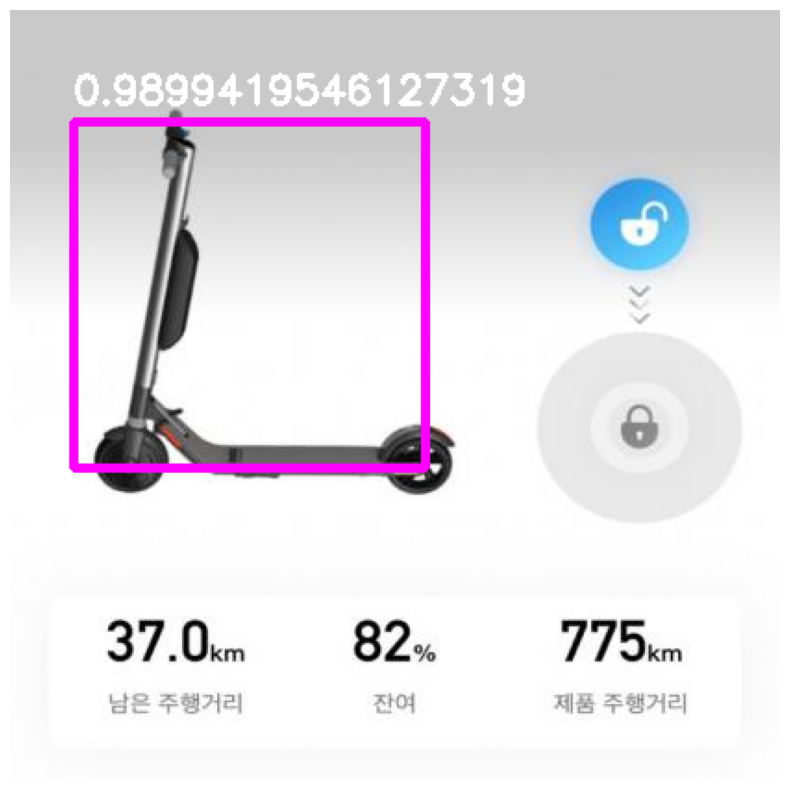

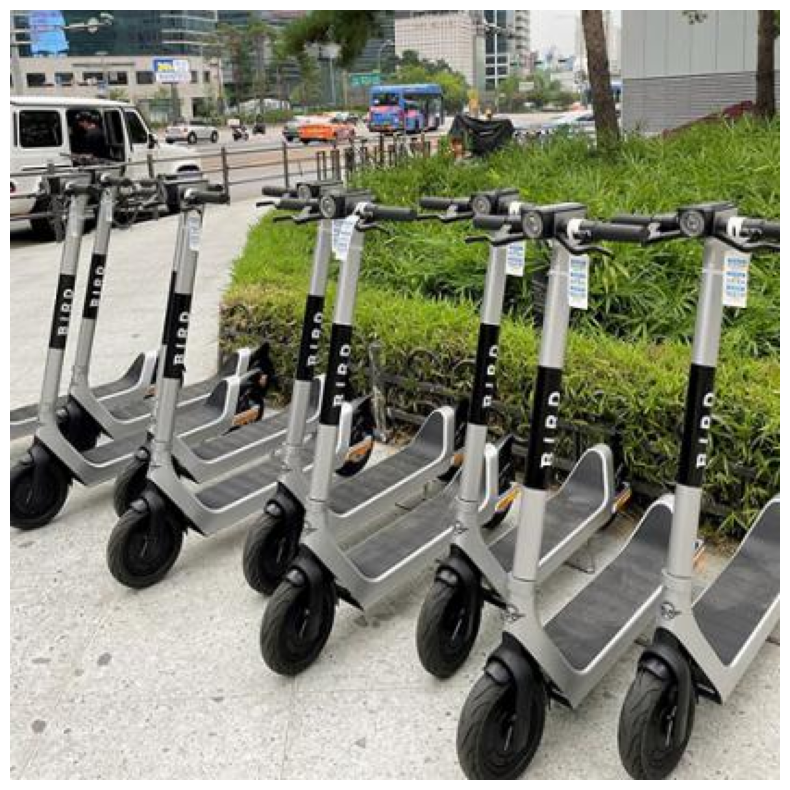

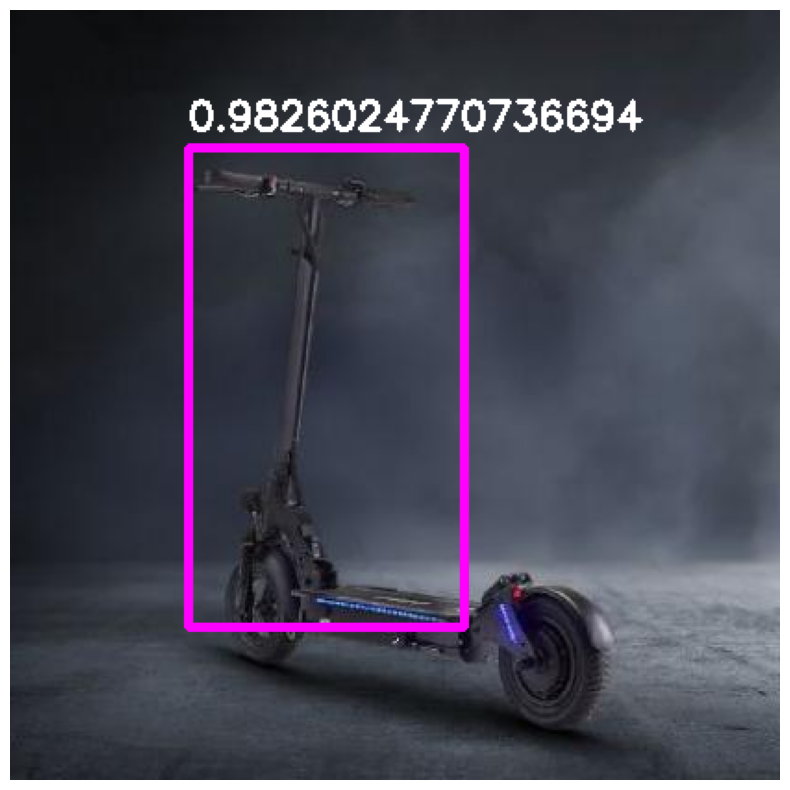

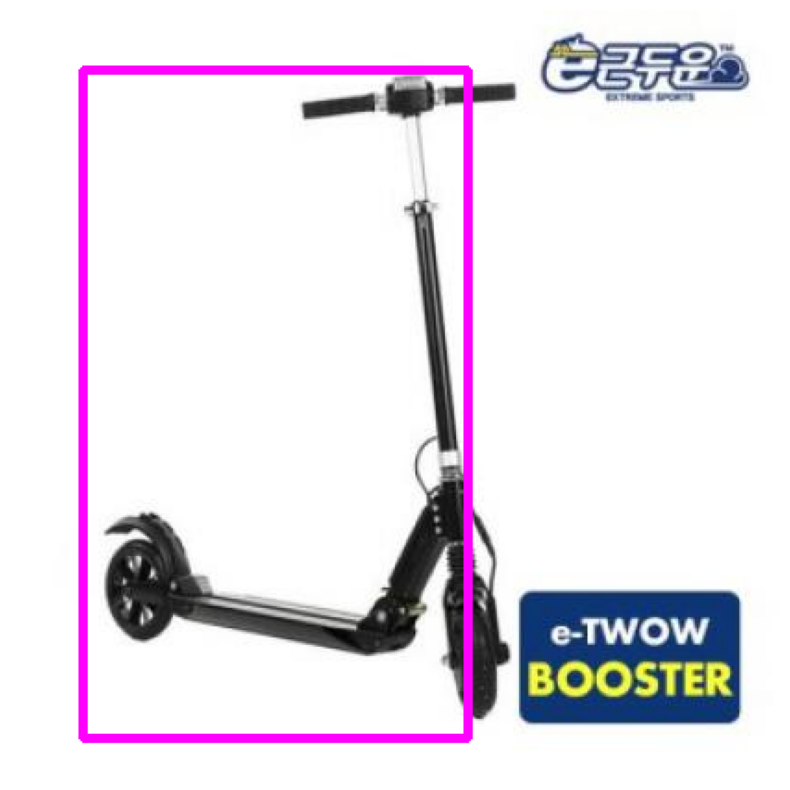

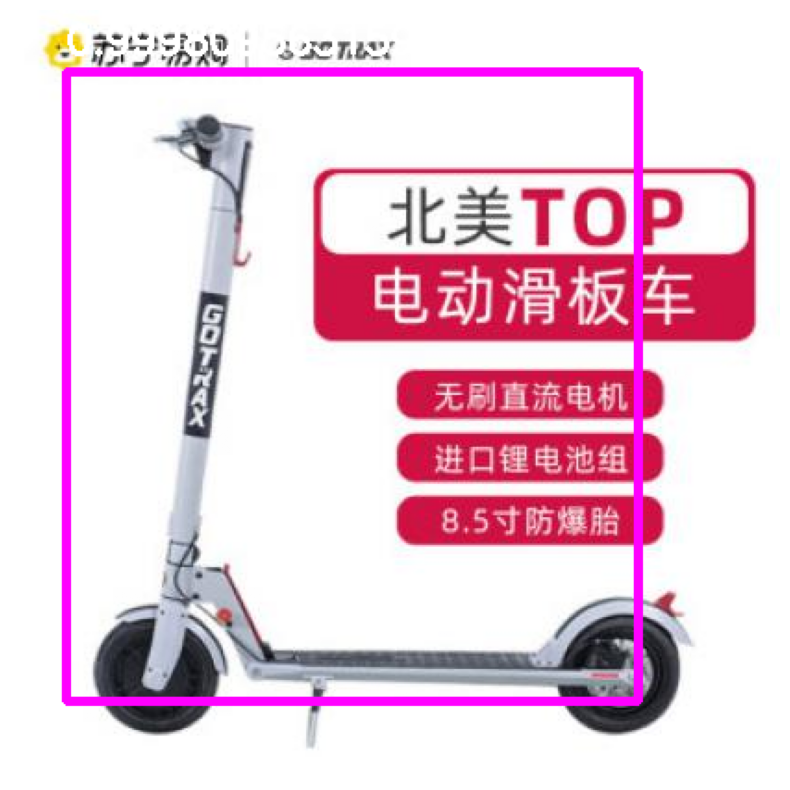

...

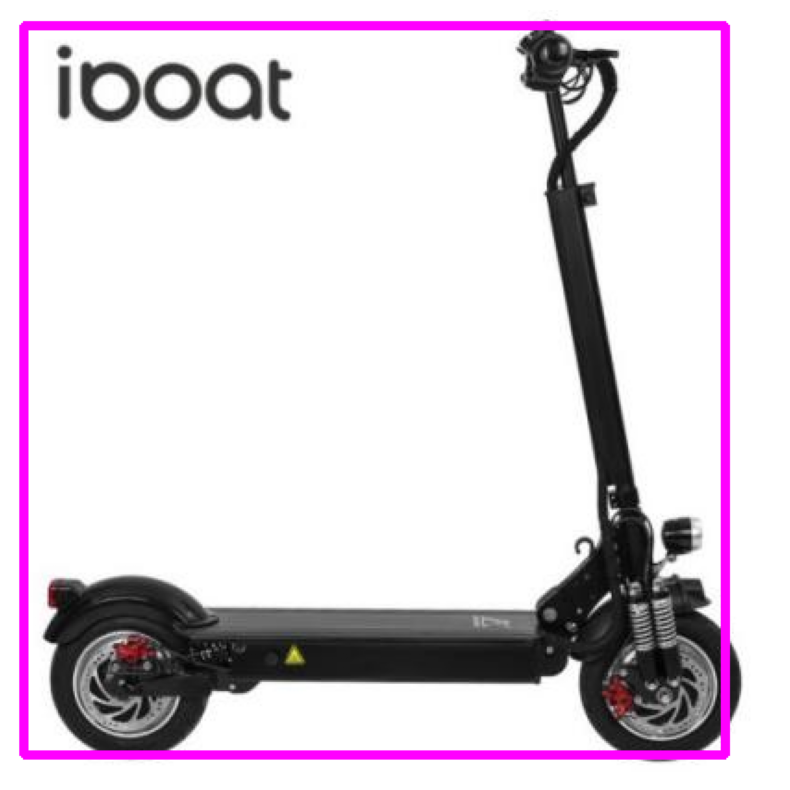

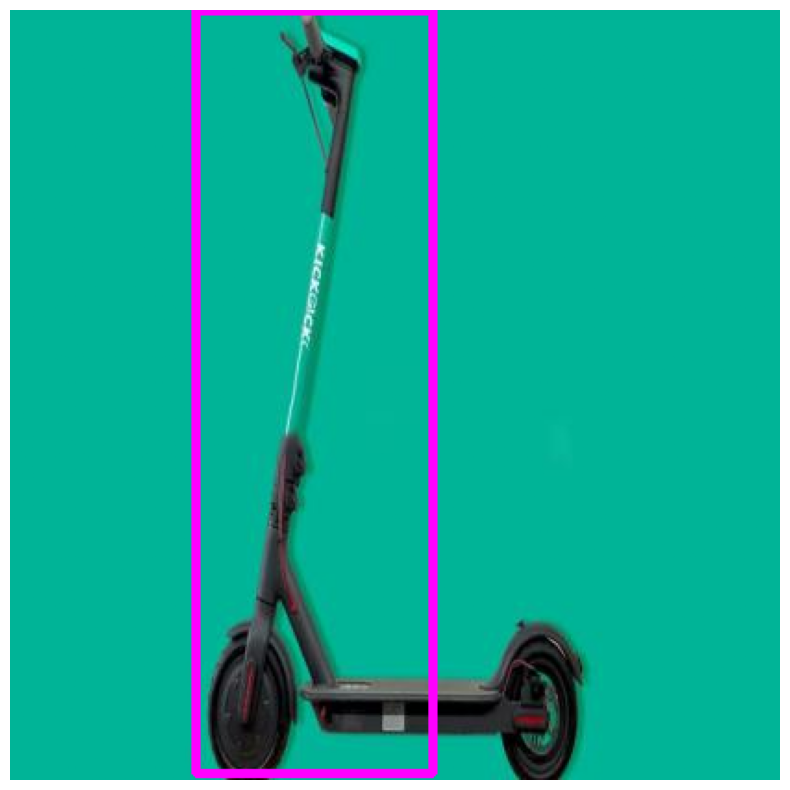

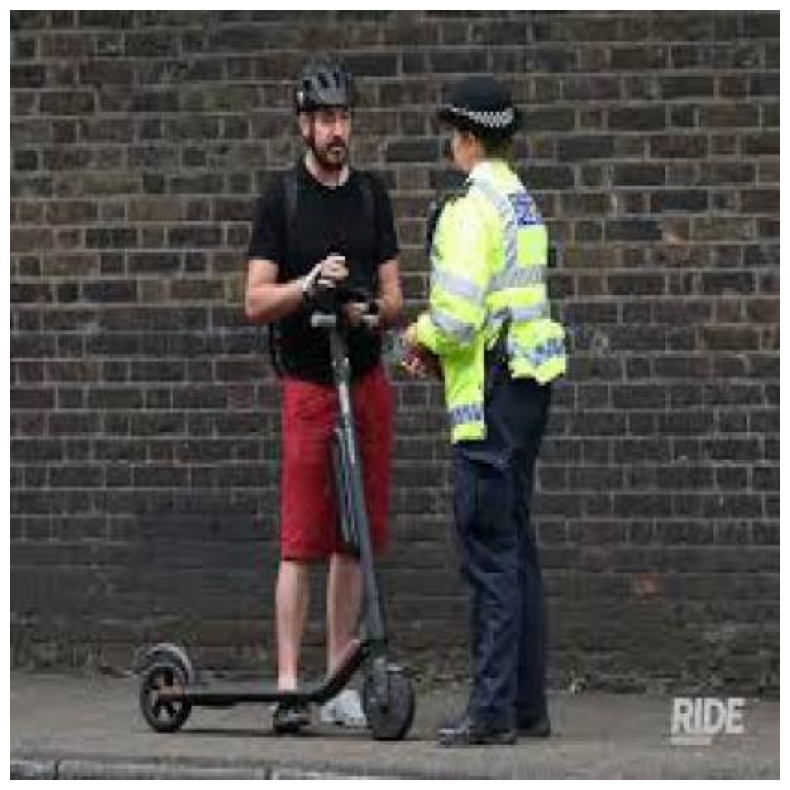

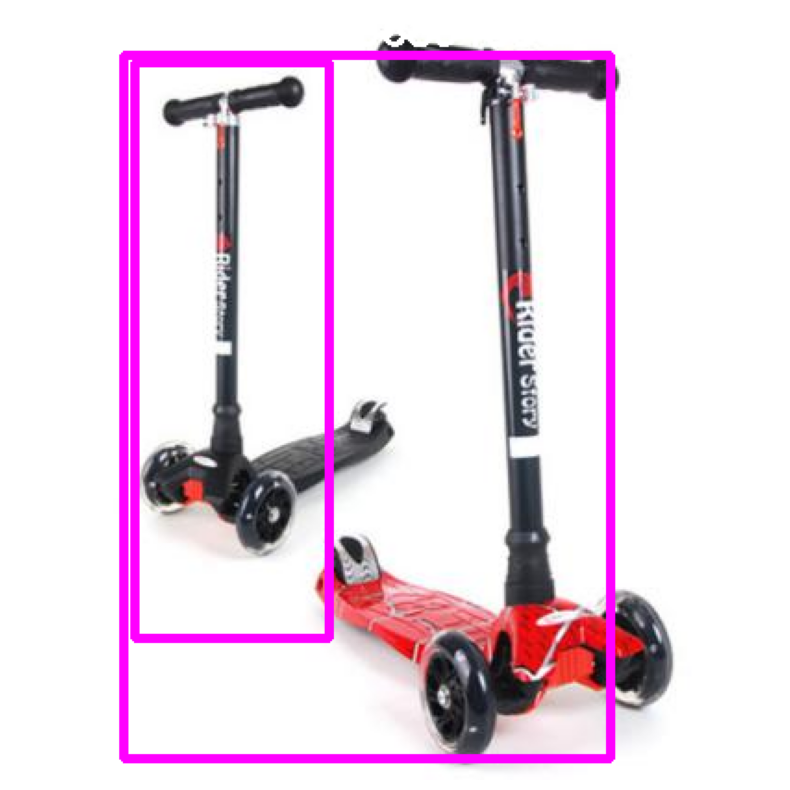

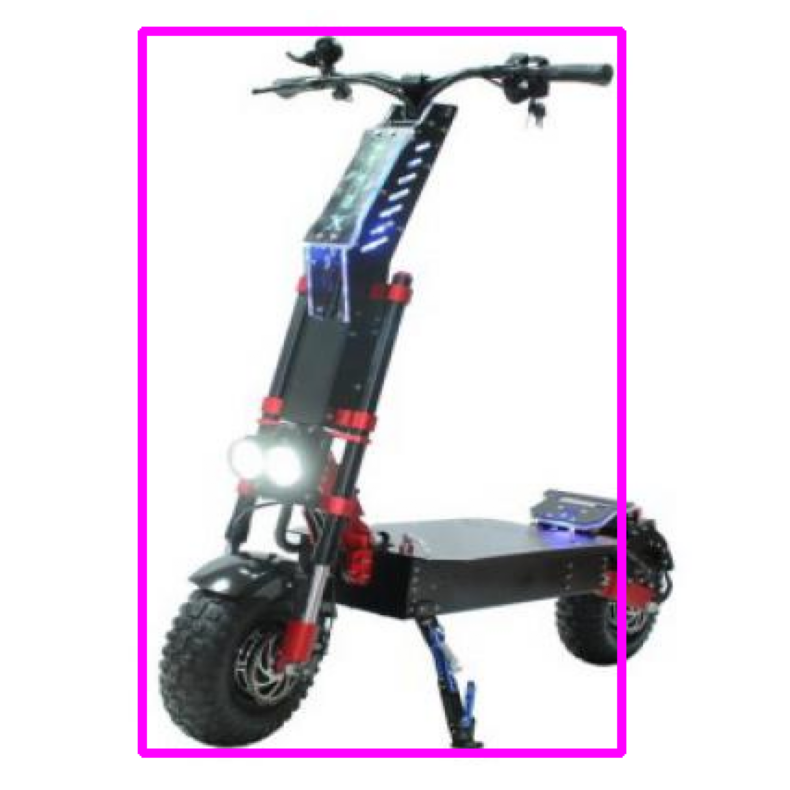

In [213]:
import seaborn as sns
import os
def val_transform(img):
    img_tensor = transforms.ToTensor()(img)
    return img_tensor.unsqueeze(0)

def show_predictions_plate(file, true_bboxes, model, treshold=0.5):
    image = Image.open(file)
    image = val_transform(image)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(image.to(device))
    
    image = cv2.imread(file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255
    
    imageRectangle = image.copy()
    h, w = image.shape[:2]
    
    pred = predictions[0]
    
    for i in range(len(pred['boxes'])):
        bbox = pred['boxes'][i].to('cpu').tolist()
        label = pred['labels'][i].to('cpu').item()
        score = pred['scores'][i].to('cpu').item()
        x1, y1, x2, y2 = map(int, bbox)
        
        
        palette = sns.color_palette(None, 1)
        color = palette[0]
        
        color_bbox = (255, 0, 255)
        color_text = (0.12156862745098039, 0.4666666666666667, 0.7058823529411765)
        thickness = 3
        if score > treshold:
            score = str(score)
            cv2.rectangle(imageRectangle, (x1, y1), (x2, y2), color_bbox, thickness)
            cv2.putText(imageRectangle, score, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color_text) * 255, 2)
    
    true_bboxes_color = (0, 255, 255)
    true_thickness = 2
    
    for bbox in true_bboxes:
        x1 = int(bbox[0] * w)
        x2 = int(bbox[1] * w)
        y1 = int(bbox[2] * h)
        y2 = int(bbox[3] * h)
        
        cv2.rectangle(imageRectangle, (x1, y1), (x2, y2), true_bboxes_color, true_thickness)
    
    
    show_image(imageRectangle)

# show_predictions_plate('/kaggle/input/oi5-ball/oi5_ball/0006.jpg', model)
# test_bboxes_dict

path = '/kaggle/working/Kick-Scooter-3-2/test/'

i = 0
for key, value in test_bboxes_dict.items():
    show_predictions_plate(path + key, value, model_pretrained)
    if i == 20:
        break
    
    i += 1

In [199]:
# from ultralytics import YOLO
from boxmot import DeepOCSORT
from pathlib import Path
from deep_sort_realtime.deepsort_tracker import DeepSort
import cv2
import numpy as np

model = YOLO("best_100.pt")

# tracking with boxmot

tracker = DeepOCSORT(
    model_weights=Path('osnet_x0_25_msmt17.pt'), # which ReID model to use
    device='cuda:0',
    fp16=False,
)

# Open video file or capture device
cap = cv2.VideoCapture('kickvideo.mp4')  # or cap = cv2.VideoCapture(0) for webcam

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    # YOLO detection
    result = model(frame)
    
    detections = []
    for idx in range(len(result[0].boxes.cls)):
        boxes = result[0].boxes.xyxy[idx].cpu().numpy()
        detections.append(
            [*boxes.tolist(), result[0].boxes.conf[idx].cpu().item(), result[0].boxes.cls[idx].cpu().item()]
        )
    detections = np.array(detections)
    if len(detections) != 0:
        # Tracker update
        tracks = tracker.update(detections, frame)
        tracker.plot_results(frame, show_trajectories=False)
    
    cv2.imshow('Tracking', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


ImportError: cannot import name '_fit_context' from 'sklearn.base' (/opt/conda/lib/python3.10/site-packages/sklearn/base.py)